## $\textit{Duffing equation}$
    The Duffing equation (or Duffing oscillator), named after Georg Duffing (1861–1944),
    is a non-linear second-order differential equation used to model certain damped and driven oscillators. 
The equation is given by
$$\displaystyle{\ddot{x}+\delta\dot{x}+\alpha{x}+\beta{x^3}=\gamma\cos(\omega{t})}$$

The parameters in the above equation are:

${\displaystyle \delta }$  controls the amount of damping,

${\displaystyle \alpha }$  controls the linear stiffness,

${\displaystyle \beta }$  controls the amount of non-linearity in the restoring force; 
if $ {\displaystyle \beta =0,}$ the Duffing equation describes a damped and driven simple harmonic oscillator,

${\displaystyle \gamma }$ is the amplitude of the periodic driving force; 
if ${\displaystyle \gamma =0}$ the system is without a driving force, and

${\displaystyle \omega }$  is the angular frequency of the periodic driving force.

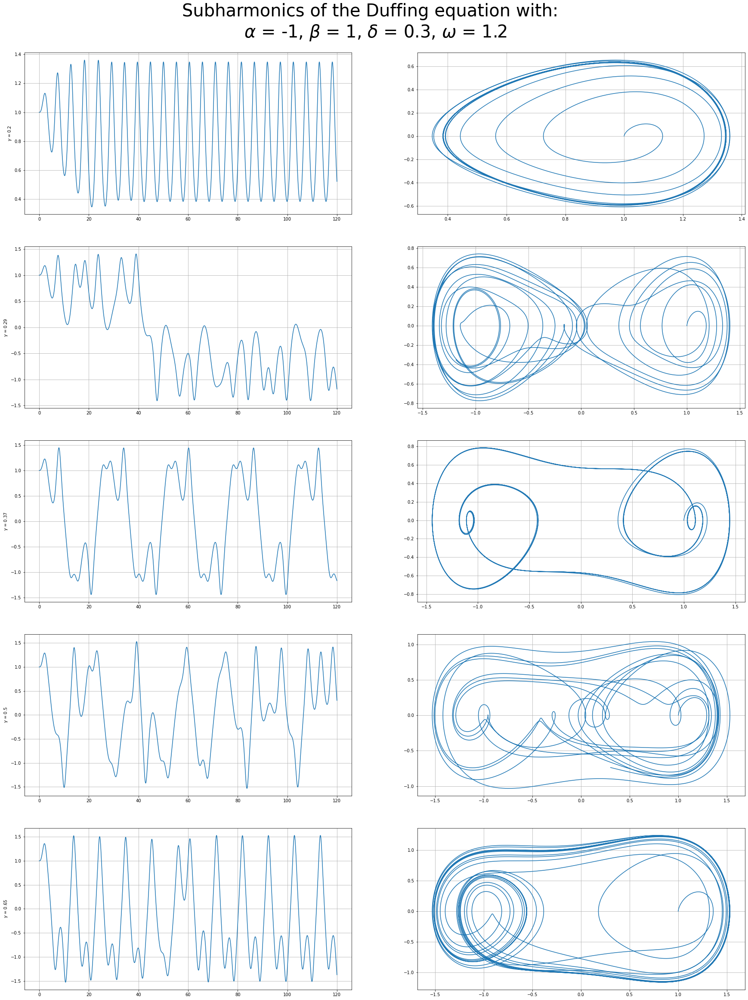

In [11]:
import numpy as np
import matplotlib.pyplot as plt
def f(t, x, y, *pars):
    delta = pars[0]
    alpha = pars[1]
    beta  = pars[2]
    gamma = pars[3]
    omega = pars[4]
    x_dot = y
    y_dot = - delta*y - alpha*x - beta*x**3 + gamma*np.sin(omega*t)
    return x_dot, y_dot
dt = 0.006
num_steps = 20000
def RK4(x0, v0, *pars):
    xs = np.zeros(num_steps + 1)
    ys = np.zeros(num_steps + 1)
    ts = np.zeros(num_steps + 1)
    xs[0], ys[0] = (x0, v0)
    for i in range(num_steps):
        xk1, yk1 = f(ts[i], xs[i], ys[i], *pars)
        xk2, yk2 = f(ts[i] + dt/2, xs[i] + xk1*dt/2, ys[i] + yk1*dt/2, *pars)
        xk3, yk3 = f(ts[i] + dt/2, xs[i] + xk2*dt/2, ys[i] + yk2*dt/2, *pars)
        xk4, yk4 = f(ts[i] + dt, xs[i] + xk3*dt, ys[i] + yk3*dt, *pars)
        xs[i + 1] = xs[i] + (dt/6)*(xk1 + 2*xk2 + 2*xk3 + xk4)
        ys[i + 1] = ys[i] + (dt/6)*(yk1 + 2*yk2 + 2*yk3 + yk4)
        ts[i + 1] = ts[i] + dt
    return xs, ys, ts
alpha, beta, delta, omega = -1, 1, 0.3, 1.2
plt.figure(1, figsize=(30, 40))
plt.suptitle('Subharmonics of the Duffing equation with: \n '
fr'$\alpha$ = {alpha}, $\beta$ = {beta}, $\delta$ = {delta}, $\omega$ = {omega}',fontsize=40,y=0.92)
G = np.array([0.20, 0.29, 0.37, 0.50, 0.65])
i = 1
for g in G:
    x, y, t = RK4(1, 0, delta, alpha, beta, g, omega)
    plt.subplot(len(G), 2, i)
    plt.ylabel(f'$\gamma$ = {g}')
    plt.grid()
    plt.plot(t, x)
    plt.subplot(len(G), 2, i+1)
    plt.grid()
    plt.plot(x, y)
    i += 2
plt.show()

In [1]:
import numpy as np
import scipy.integrate as SI
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')    #suppress warnings

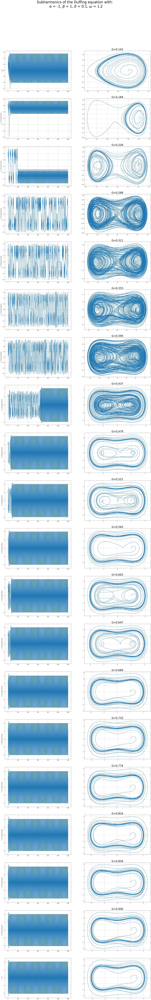

In [4]:
import numpy as np
import matplotlib.pyplot as plt
def f(t, x, y, *pars):
    delta = pars[0]
    alpha = pars[1]
    beta  = pars[2]
    gamma = pars[3]
    omega = pars[4]
    x_dot = y
    y_dot = - delta*y - alpha*x - beta*x**3 + gamma*np.sin(omega*t)
    return x_dot, y_dot
dt = 0.006
num_steps = 200000
def RK4(x0, v0, *pars):
    xs = np.zeros(num_steps + 1)
    ys = np.zeros(num_steps + 1)
    ts = np.zeros(num_steps + 1)
    xs[0], ys[0] = (x0, v0)
    for i in range(num_steps):
        xk1, yk1 = f(ts[i], xs[i], ys[i], *pars)
        xk2, yk2 = f(ts[i] + dt/2, xs[i] + xk1*dt/2, ys[i] + yk1*dt/2, *pars)
        xk3, yk3 = f(ts[i] + dt/2, xs[i] + xk2*dt/2, ys[i] + yk2*dt/2, *pars)
        xk4, yk4 = f(ts[i] + dt, xs[i] + xk3*dt, ys[i] + yk3*dt, *pars)
        xs[i + 1] = xs[i] + (dt/6)*(xk1 + 2*xk2 + 2*xk3 + xk4)
        ys[i + 1] = ys[i] + (dt/6)*(yk1 + 2*yk2 + 2*yk3 + yk4)
        ts[i + 1] = ts[i] + dt
    return xs, ys, ts
alpha, beta, delta, omega = -1, 1, 0.1, 1.2
#G = np.array([0.05,0.1,0.15,0.17,0.19,0.20, 0.25, 0.37, 0.50, 0.65])
G=np.linspace(0.1,0.9,20)
lG=len(G)
plt.figure(1, figsize=(30,10*lG))
plt.suptitle('Subharmonics of the Duffing equation with: \n '
fr'$\alpha$ = {alpha}, $\beta$ = {beta}, $\delta$ = {delta}, $\omega$ = {omega}',fontsize=40,y=0.92)
i = 1
for g in G:
    x, y, t = RK4(1, 0, delta, alpha, beta, g, omega)
    plt.title("G=%.3f"%g,size=30)
    plt.subplot(lG, 2, i)
    plt.ylabel(f'$\gamma$ = {g}')
    plt.grid()
    plt.plot(t, x)
    plt.subplot(len(G), 2, i+1)
    plt.grid()
    plt.plot(x, y)
    
    i += 2
plt.show()